Some problems in using $\epsilon$-greedy MABs:
* fixed $\epsilon$ - even after learning the best advt, we "waste" impressions in exploration. We need something like an adaptive $\epsilon$, that naturally stops exploring after enough impressions.
* is there a better way to estimate CTR other than the "average so far"? What happens in the initial iterations when data is small?

We now look at Bayesian MABs. The two key ideas we need are:
* Bayesian Learning
* Thompson Sampling

Of these, its important to get Bayesian Learning right; from there, getting to the MABs is a small step via Thompson sampling.

The focus would be understanding system behavior ignoring much of the math. We will begin by analyzing "coin flips" of a biased coin - since that's what most introductory tutorials talk about; this makes it easy to look up additional references later.

So far, we have looked at the **frequentist** way of doing things:
* Bias of coin flip after n trials is measured by the proprotion of "heads" seen.

The **Bayesian** way is this:
* We begin with a guess of coin-bias (our parameter of interest). This is our **prior**.
* As we observe data:
    * We test its **likelihood** of being seen against our current guess for the parameters (the current **prior**).
    * We update our guess based on this check. This new guess is the **posterior**.
* *Repeat* as data keeps coming in.

$posterior \propto likelihood \times prior$

**Notes**
* (Bayesian) What we are saying is without enough data, we have no reason to change our belief drastically.
* With enough data, the frequentist and bayesian approaches reach the same answer.
* (Bayesian) But there's always the benefit of being able to quantify uncertainty etc

#heads: 709, #tails: 291


Text(0.5, 1.0, 'num_flips=1000')

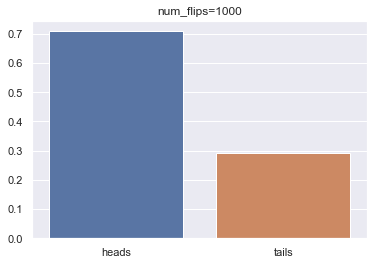

In [3]:
import numpy as np, random
from matplotlib import pyplot as plt
import seaborn as sns; sns.set()

def posterior_params(coin_flips, prior_a, prior_b):
    """
    Compute the posterior parameters for a Beta distribution, given the priors and observed coin flip array.
    This is the function we use to update/revise our belief about coin bias.
    """
    num_flips = len(coin_flips)
    num_heads = coin_flips.count(True)
    num_tails = coin_flips.count(False)
    
    return prior_a + num_heads, prior_b + num_tails

def simulate_biased_coin(bias_prob=0.5, num_flips=50):
    """
    Generate a sequence of flips, True for head, False for tail.
    bias_prob: probability of heads
    """
    flips = []
    for i in range(num_flips):
        if random.random() <= bias_prob:
            flips.append(True)
        else:
            flips.append(False)
    return flips

# lets try out the coin simulator
coin_flips = simulate_biased_coin(0.7, 1000)
    
%matplotlib inline
num_flips = len(coin_flips)
num_heads = coin_flips.count(True)
num_tails = coin_flips.count(False)
print(f"#heads: {num_heads}, #tails: {num_tails}")
sns.barplot(x=["heads", 'tails'], y=[1.0*num_heads/num_flips, 1.0*num_tails/num_flips]).set_title(f"num_flips={num_flips}")

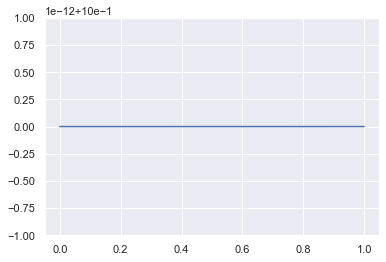

In [4]:
# lets plot a beta 
import scipy
prior_a, prior_b = 1, 1 # shape parameters
x = np.linspace(0, 1, 1000)
y = scipy.stats.beta.pdf(x, prior_a, prior_b)
plt.plot(x, y)

# sample some values
#print(sorted(scipy.stats.beta.rvs(prior_a, prior_b, size=20)))

[0.47392998518014995, 0.48001282401694806, 0.4820815494938587, 0.4826650916829082, 0.4860202462367927, 0.4866071522106637, 0.4866990862293625, 0.4950671673301311, 0.4952258671379185, 0.49543313979550907, 0.49717016390172697, 0.5019532118493906, 0.505933996783539, 0.5074030347077361, 0.5131769853247788, 0.5202674762037631, 0.5203622790585315, 0.524630532122444, 0.5312931981860485, 0.5317052288742236]


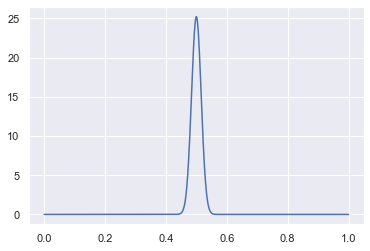

In [6]:
# lets plot a beta 
import scipy
prior_a, prior_b = 500, 500 # shape parameters
x = np.linspace(0, 1, 1000)
y = scipy.stats.beta.pdf(x, prior_a, prior_b)
plt.plot(x, y)

# sample some values
print(sorted(scipy.stats.beta.rvs(prior_a, prior_b, size=20)))

Text(0.5, 1.0, '5 coin flips.')

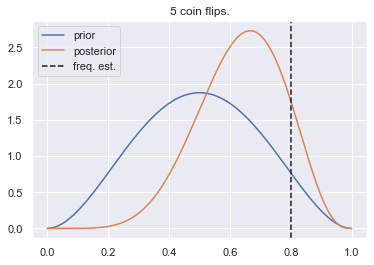

In [7]:
# what does this look like once we flip a biased coin a few times?
prior_a, prior_b = 3, 3
coin_flips = simulate_biased_coin(0.7,5)
posterior_a, posterior_b =  posterior_params(coin_flips, prior_a, prior_b)

# the frequentist estimate
freq_p = 1.0 * coin_flips.count(True) / len(coin_flips)

# plot the betas
fig = plt.figure()
ax = plt.subplot(111)
ax.plot(x, scipy.stats.beta.pdf(x, prior_a, prior_b), label='prior')
ax.plot(x, scipy.stats.beta.pdf(x, posterior_a, posterior_b), label='posterior')
ax.axvline(freq_p, 0, 1, label='freq. est.', color='k', linestyle='--')
ax.legend()
ax.set_title(f"{len(coin_flips)} coin flips.")

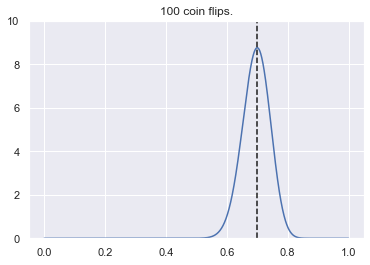

In [8]:
#we can see the beta change in real-time too, as it absorbs each coin flip
import time
import pylab as pl
from IPython import display

prior_a, prior_b = 1, 1
coin_flips = simulate_biased_coin(0.7, 100)

for idx, one_flip in enumerate(coin_flips):
    plt.clf()
    flips_so_far = coin_flips[:idx+1]
    
    posterior_a, posterior_b =  posterior_params([one_flip], prior_a, prior_b)
    freq_p = 1.0 * flips_so_far.count(True) / (idx+1)
    plt.plot(x, scipy.stats.beta.pdf(x, posterior_a, posterior_b), label='posterior')
    plt.axvline(freq_p, 0, 1, label='freq. est.', color='k', linestyle='--')
    plt.title(f"{idx+1} coin flips.")
    plt.ylim(0, 10)
 
    prior_a, prior_b = posterior_a, posterior_b
    display.display(pl.gcf())
    display.clear_output(wait=True)
    
    time.sleep(0.01)

display.clear_output(wait=True)

So far we have just learned to estimate the bias of a coin. How does this relate to a MAB?
If the coin is an advt, and its bias is the CTR, we now have a way to:
* incorporate domain knowledge of the CTR as a prior
* update CTR in a systematic way and online manner as we observe more data
* talk about the uncertainty of the knowledge of the CTR

How do use this knowledge as part of a knowledge CTR? How do we **explore/exploit** - which we know to be critical?

These are our priors: {'A': {'a': 3.0, 'b': 3.0}, 'B': {'a': 3.0, 'b': 3.0}, 'C': {'a': 3.0, 'b': 3.0}, 'D': {'a': 3.0, 'b': 3.0}}


C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  prob_df = prob_df.append({'t':i, 'prob':1.0*advts_shown_so_far.count(advt_id)/i, 'advt': advt_id},
C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  prob_df = prob_df.append({'t':i, 'prob':1.0*advts_shown_so_far.count(advt_id)/i, 'advt': advt_id},
C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  prob_df = prob_df.append({'t':i, 'prob':1.0*advts_shown_so_far.count(advt_id)/i, 'advt': advt_id},
C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The

<AxesSubplot:xlabel='t', ylabel='prob'>

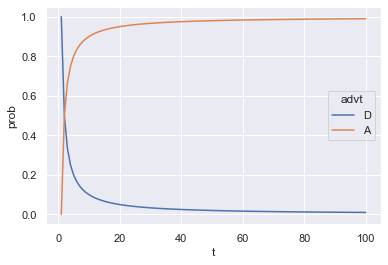

In [9]:
from collections import defaultdict
import pandas as pd, seaborn as sns

# lets revisit the setup from the previous tutorial

# these are our advts and CTRs
advt_ctr = {'A': 0.8, 'B': 0.7, 'C': 0.1, 'D': 0.01}

# this is our user simulator
def show_advt_to_user(advt_id):
    ctr = advt_ctr[advt_id]
    if random.random() <=ctr:
        return True
    else:
        return False

def get_prob_at_t(advt_sequence):
    unique_advts = set(advt_sequence)
    prob_df = pd.DataFrame(columns=['t', 'prob', 'advt'])
    for i in range(1, len(advt_sequence)+1):
        advts_shown_so_far = advt_sequence[:i]
        for advt_id in unique_advts:
    #         advt_prob_at_t[advt_id].append(1.0*advts_shown_so_far.count(advt_id)/i)
            prob_df = prob_df.append({'t':i, 'prob':1.0*advts_shown_so_far.count(advt_id)/i, 'advt': advt_id}, 
                                     ignore_index=True)
    return prob_df
    


beta_params = dict([(k, {'a': 3.0, 'b': 3.0}) for k in  advt_ctr.keys()])
print(f"These are our priors: {beta_params}")

def greedy_bayesian(n, beta_params):
    empirical_clicks = defaultdict(list)
    advt_sequence = []

    for idx, i in enumerate(range(n)):
        if idx==0:
            advt_to_show = random.choice(list(advt_ctr.keys())) # we pick a random advt
        else:
            means = {}
            for k, v in beta_params.items():
                means[k] = scipy.stats.beta.mean(v['a'], v['b'])
            advt_to_show = max(means.items(), key=lambda t: t[1])[0]

        advt_sequence.append(advt_to_show)
        was_clicked = show_advt_to_user(advt_to_show)
        empirical_clicks[advt_to_show].append(was_clicked)
        
        # NEW: update parameters
        prior_a, prior_b = beta_params[advt_to_show]['a'], beta_params[advt_to_show]['b']
        posterior_a, posterior_b  = posterior_params([was_clicked], prior_a, prior_b)
        beta_params[advt_to_show]['a'] = posterior_a
        beta_params[advt_to_show]['b'] = posterior_b
    
    return empirical_clicks, advt_sequence

n=100
empirical_clicks, advt_sequence = greedy_bayesian(n, beta_params)
sns.lineplot(x="t", y="prob", hue="advt", data=get_prob_at_t(advt_sequence))
    

These are our priors: {'A': {'a': 1.0, 'b': 1.0}, 'B': {'a': 1.0, 'b': 1.0}, 'C': {'a': 1.0, 'b': 1.0}, 'D': {'a': 1.0, 'b': 1.0}}
Running simulation 1


C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  prob_df = prob_df.append({'t':i, 'prob':1.0*advts_shown_so_far.count(advt_id)/i, 'advt': advt_id},
C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  prob_df = prob_df.append({'t':i, 'prob':1.0*advts_shown_so_far.count(advt_id)/i, 'advt': advt_id},
C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  prob_df = prob_df.append({'t':i, 'prob':1.0*advts_shown_so_far.count(advt_id)/i, 'advt': advt_id},
C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The

Running simulation 2


C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  prob_df = prob_df.append({'t':i, 'prob':1.0*advts_shown_so_far.count(advt_id)/i, 'advt': advt_id},
C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  prob_df = prob_df.append({'t':i, 'prob':1.0*advts_shown_so_far.count(advt_id)/i, 'advt': advt_id},
C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  prob_df = prob_df.append({'t':i, 'prob':1.0*advts_shown_so_far.count(advt_id)/i, 'advt': advt_id},
C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The

Running simulation 3


C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  prob_df = prob_df.append({'t':i, 'prob':1.0*advts_shown_so_far.count(advt_id)/i, 'advt': advt_id},
C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  prob_df = prob_df.append({'t':i, 'prob':1.0*advts_shown_so_far.count(advt_id)/i, 'advt': advt_id},
C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  prob_df = prob_df.append({'t':i, 'prob':1.0*advts_shown_so_far.count(advt_id)/i, 'advt': advt_id},
C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The

Running simulation 4


C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  prob_df = prob_df.append({'t':i, 'prob':1.0*advts_shown_so_far.count(advt_id)/i, 'advt': advt_id},
C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  prob_df = prob_df.append({'t':i, 'prob':1.0*advts_shown_so_far.count(advt_id)/i, 'advt': advt_id},
C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  prob_df = prob_df.append({'t':i, 'prob':1.0*advts_shown_so_far.count(advt_id)/i, 'advt': advt_id},
C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The

Running simulation 5


C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  prob_df = prob_df.append({'t':i, 'prob':1.0*advts_shown_so_far.count(advt_id)/i, 'advt': advt_id},
C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  prob_df = prob_df.append({'t':i, 'prob':1.0*advts_shown_so_far.count(advt_id)/i, 'advt': advt_id},
C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  prob_df = prob_df.append({'t':i, 'prob':1.0*advts_shown_so_far.count(advt_id)/i, 'advt': advt_id},
C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The

Running simulation 6


C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  prob_df = prob_df.append({'t':i, 'prob':1.0*advts_shown_so_far.count(advt_id)/i, 'advt': advt_id},
C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  prob_df = prob_df.append({'t':i, 'prob':1.0*advts_shown_so_far.count(advt_id)/i, 'advt': advt_id},
C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  prob_df = prob_df.append({'t':i, 'prob':1.0*advts_shown_so_far.count(advt_id)/i, 'advt': advt_id},
C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The

Running simulation 7


C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  prob_df = prob_df.append({'t':i, 'prob':1.0*advts_shown_so_far.count(advt_id)/i, 'advt': advt_id},
C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  prob_df = prob_df.append({'t':i, 'prob':1.0*advts_shown_so_far.count(advt_id)/i, 'advt': advt_id},
C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  prob_df = prob_df.append({'t':i, 'prob':1.0*advts_shown_so_far.count(advt_id)/i, 'advt': advt_id},
C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The

Running simulation 8


C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  prob_df = prob_df.append({'t':i, 'prob':1.0*advts_shown_so_far.count(advt_id)/i, 'advt': advt_id},
C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  prob_df = prob_df.append({'t':i, 'prob':1.0*advts_shown_so_far.count(advt_id)/i, 'advt': advt_id},
C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  prob_df = prob_df.append({'t':i, 'prob':1.0*advts_shown_so_far.count(advt_id)/i, 'advt': advt_id},
C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The

Running simulation 9


C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  prob_df = prob_df.append({'t':i, 'prob':1.0*advts_shown_so_far.count(advt_id)/i, 'advt': advt_id},
C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  prob_df = prob_df.append({'t':i, 'prob':1.0*advts_shown_so_far.count(advt_id)/i, 'advt': advt_id},
C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  prob_df = prob_df.append({'t':i, 'prob':1.0*advts_shown_so_far.count(advt_id)/i, 'advt': advt_id},
C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The

Running simulation 10


C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  prob_df = prob_df.append({'t':i, 'prob':1.0*advts_shown_so_far.count(advt_id)/i, 'advt': advt_id},
C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  prob_df = prob_df.append({'t':i, 'prob':1.0*advts_shown_so_far.count(advt_id)/i, 'advt': advt_id},
C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  prob_df = prob_df.append({'t':i, 'prob':1.0*advts_shown_so_far.count(advt_id)/i, 'advt': advt_id},
C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The

(9000, 3)


C:\Users\Shubham\anaconda3\lib\site-packages\seaborn\_core.py:1057: FutureWarning: reindexing with a non-unique Index is deprecated and will raise in a future version.
  comp_col.loc[orig.index] = pd.to_numeric(axis.convert_units(orig))


ValueError: cannot reindex on an axis with duplicate labels

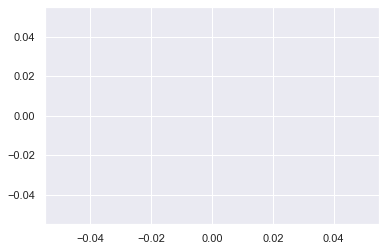

In [11]:
# lets simulate the greedy-bayesian a few times
num_simulations, n = 10, 500
beta_params = dict([(k, {'a': 1.0, 'b': 1.0}) for k in  advt_ctr.keys()])
print(f"These are our priors: {beta_params}")
dfs=[]
for sim in range(num_simulations):
    print(f"Running simulation {sim+1}")
    beta_params = dict([(k, {'a': 1.0, 'b': 1.0}) for k in  advt_ctr.keys()])
    empirical_clicks, advt_sequence = greedy_bayesian(n, beta_params)
    dfs.append(get_prob_at_t(advt_sequence))
df_all_sim = pd.concat(dfs)
# print(df_all_sim.head(20))
print(df_all_sim.shape)

unique = np.sort(df_all_sim["advt"].unique())
palette = dict(zip(unique, sns.color_palette(n_colors=len(unique))))
sns.lineplot(data=df_all_sim, x="t", y="prob", hue="advt", err_style="band",  ci=95, palette=palette)

What's missing above is:
* we are ignoring the uncertainty in estimates
* we are not exploring

These are related. We want to move the unified idea that "if we are uncertain, we explore".

These are our priors: {'A': {'a': 1.0, 'b': 1.0}, 'B': {'a': 1.0, 'b': 1.0}, 'C': {'a': 1.0, 'b': 1.0}, 'D': {'a': 1.0, 'b': 1.0}}


C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  prob_df = prob_df.append({'t':i, 'prob':1.0*advts_shown_so_far.count(advt_id)/i, 'advt': advt_id},
C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  prob_df = prob_df.append({'t':i, 'prob':1.0*advts_shown_so_far.count(advt_id)/i, 'advt': advt_id},
C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  prob_df = prob_df.append({'t':i, 'prob':1.0*advts_shown_so_far.count(advt_id)/i, 'advt': advt_id},
C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The

Text(0.5, 0, 'number of impressions')

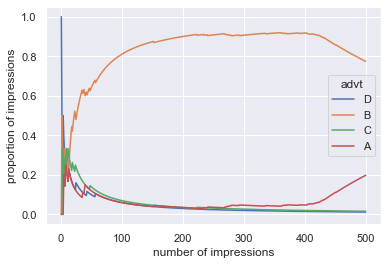

In [12]:
beta_params = dict([(k, {'a': 1.0, 'b': 1.0}) for k in  advt_ctr.keys()])
print(f"These are our priors: {beta_params}")

def thompson_sampling(n, beta_params):
    empirical_clicks = defaultdict(list)
    advt_sequence = []

    for idx, i in enumerate(range(n)):
        if idx==0:
            advt_to_show = random.choice(list(advt_ctr.keys())) # we pick a random advt
        else:
            sampled_ctr = {}
            for k, v in beta_params.items():
                sampled_ctr[k] = scipy.stats.beta.rvs(v['a'], v['b'], size=1)[0]
                #print(sampled_ctr[k])
            advt_to_show = max(sampled_ctr.items(), key=lambda t: t[1])[0]

        advt_sequence.append(advt_to_show)
        was_clicked = show_advt_to_user(advt_to_show)
        empirical_clicks[advt_to_show].append(was_clicked)
        
        # NEW: update parameters
        prior_a, prior_b = beta_params[advt_to_show]['a'], beta_params[advt_to_show]['b']
        posterior_a, posterior_b  = posterior_params([was_clicked], prior_a, prior_b)
        beta_params[advt_to_show]['a'] = posterior_a
        beta_params[advt_to_show]['b'] = posterior_b
    
    return empirical_clicks, advt_sequence

n=500
empirical_clicks, advt_sequence = thompson_sampling(n, beta_params)
ax=sns.lineplot(x="t", y="prob", hue="advt", data=get_prob_at_t(advt_sequence))
ax.set_ylabel("proportion of impressions")
ax.set_xlabel("number of impressions")
    

These are our priors: {'A': {'a': 1.0, 'b': 1.0}, 'B': {'a': 1.0, 'b': 1.0}, 'C': {'a': 1.0, 'b': 1.0}, 'D': {'a': 1.0, 'b': 1.0}}
Running simulation 1


C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  prob_df = prob_df.append({'t':i, 'prob':1.0*advts_shown_so_far.count(advt_id)/i, 'advt': advt_id},
C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  prob_df = prob_df.append({'t':i, 'prob':1.0*advts_shown_so_far.count(advt_id)/i, 'advt': advt_id},
C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  prob_df = prob_df.append({'t':i, 'prob':1.0*advts_shown_so_far.count(advt_id)/i, 'advt': advt_id},
C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The

Running simulation 2


C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  prob_df = prob_df.append({'t':i, 'prob':1.0*advts_shown_so_far.count(advt_id)/i, 'advt': advt_id},
C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  prob_df = prob_df.append({'t':i, 'prob':1.0*advts_shown_so_far.count(advt_id)/i, 'advt': advt_id},
C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  prob_df = prob_df.append({'t':i, 'prob':1.0*advts_shown_so_far.count(advt_id)/i, 'advt': advt_id},
C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The

Running simulation 3


C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  prob_df = prob_df.append({'t':i, 'prob':1.0*advts_shown_so_far.count(advt_id)/i, 'advt': advt_id},
C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  prob_df = prob_df.append({'t':i, 'prob':1.0*advts_shown_so_far.count(advt_id)/i, 'advt': advt_id},
C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  prob_df = prob_df.append({'t':i, 'prob':1.0*advts_shown_so_far.count(advt_id)/i, 'advt': advt_id},
C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The

Running simulation 4


C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  prob_df = prob_df.append({'t':i, 'prob':1.0*advts_shown_so_far.count(advt_id)/i, 'advt': advt_id},
C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  prob_df = prob_df.append({'t':i, 'prob':1.0*advts_shown_so_far.count(advt_id)/i, 'advt': advt_id},
C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  prob_df = prob_df.append({'t':i, 'prob':1.0*advts_shown_so_far.count(advt_id)/i, 'advt': advt_id},
C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The

Running simulation 5


C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  prob_df = prob_df.append({'t':i, 'prob':1.0*advts_shown_so_far.count(advt_id)/i, 'advt': advt_id},
C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  prob_df = prob_df.append({'t':i, 'prob':1.0*advts_shown_so_far.count(advt_id)/i, 'advt': advt_id},
C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  prob_df = prob_df.append({'t':i, 'prob':1.0*advts_shown_so_far.count(advt_id)/i, 'advt': advt_id},
C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The

Running simulation 6


C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  prob_df = prob_df.append({'t':i, 'prob':1.0*advts_shown_so_far.count(advt_id)/i, 'advt': advt_id},
C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  prob_df = prob_df.append({'t':i, 'prob':1.0*advts_shown_so_far.count(advt_id)/i, 'advt': advt_id},
C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  prob_df = prob_df.append({'t':i, 'prob':1.0*advts_shown_so_far.count(advt_id)/i, 'advt': advt_id},
C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The

Running simulation 7


C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  prob_df = prob_df.append({'t':i, 'prob':1.0*advts_shown_so_far.count(advt_id)/i, 'advt': advt_id},
C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  prob_df = prob_df.append({'t':i, 'prob':1.0*advts_shown_so_far.count(advt_id)/i, 'advt': advt_id},
C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  prob_df = prob_df.append({'t':i, 'prob':1.0*advts_shown_so_far.count(advt_id)/i, 'advt': advt_id},
C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The

Running simulation 8


C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  prob_df = prob_df.append({'t':i, 'prob':1.0*advts_shown_so_far.count(advt_id)/i, 'advt': advt_id},
C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  prob_df = prob_df.append({'t':i, 'prob':1.0*advts_shown_so_far.count(advt_id)/i, 'advt': advt_id},
C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  prob_df = prob_df.append({'t':i, 'prob':1.0*advts_shown_so_far.count(advt_id)/i, 'advt': advt_id},
C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The

Running simulation 9


C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  prob_df = prob_df.append({'t':i, 'prob':1.0*advts_shown_so_far.count(advt_id)/i, 'advt': advt_id},
C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  prob_df = prob_df.append({'t':i, 'prob':1.0*advts_shown_so_far.count(advt_id)/i, 'advt': advt_id},
C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  prob_df = prob_df.append({'t':i, 'prob':1.0*advts_shown_so_far.count(advt_id)/i, 'advt': advt_id},
C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The

Running simulation 10


C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  prob_df = prob_df.append({'t':i, 'prob':1.0*advts_shown_so_far.count(advt_id)/i, 'advt': advt_id},
C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  prob_df = prob_df.append({'t':i, 'prob':1.0*advts_shown_so_far.count(advt_id)/i, 'advt': advt_id},
C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  prob_df = prob_df.append({'t':i, 'prob':1.0*advts_shown_so_far.count(advt_id)/i, 'advt': advt_id},
C:\Users\Shubham\AppData\Local\Temp\ipykernel_31724\2216872282.py:24: FutureWarning: The

(20000, 3)


C:\Users\Shubham\anaconda3\lib\site-packages\seaborn\_core.py:1057: FutureWarning: reindexing with a non-unique Index is deprecated and will raise in a future version.
  comp_col.loc[orig.index] = pd.to_numeric(axis.convert_units(orig))


ValueError: cannot reindex on an axis with duplicate labels

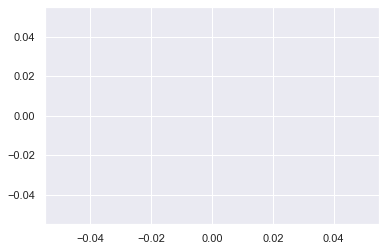

In [13]:
# lets run this simulation a few times and look at the average behavior
num_simulations, n = 10, 500
beta_params = dict([(k, {'a': 1.0, 'b': 1.0}) for k in  advt_ctr.keys()])
print(f"These are our priors: {beta_params}")
dfs=[]
for sim in range(num_simulations):
    print(f"Running simulation {sim+1}")
    beta_params = dict([(k, {'a': 1.0, 'b': 1.0}) for k in  advt_ctr.keys()])
    empirical_clicks, advt_sequence = thompson_sampling(n, beta_params)
    dfs.append(get_prob_at_t(advt_sequence))
df_all_sim = pd.concat(dfs)
# print(df_all_sim.head(20))
print(df_all_sim.shape)

unique = np.sort(df_all_sim["advt"].unique())
palette = dict(zip(unique, sns.color_palette(n_colors=len(unique))))
sns.lineplot(data=df_all_sim, x="t", y="prob", hue="advt", err_style="band",  ci=95, palette=palette)

![title](simulations.png)

Did we solve our problems?
* **Problem**: fixed $\epsilon$. **Solution**: Thompson Sampling explores based on the mean *and* standard deviation of the posterior. This can drive down *regret to 0*! 
* **Problem**: need a better way to estimate CTR. **Solution**: the prior distribution helps in grounding measurement when the click data is low. It also provides us a way to quantify and utilize uncertainty information.

Next problem to look at:

**Problem**: What if different users like different advts? How do we take user characterestics into account?

**Solution**: Contextual Bandits.